# ECE219 Project 4

In [3]:
!pip3 install ucimlrepo
!pip3 install ydata-profiling

You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.9/bin/python3.9 -m pip install --upgrade pip' command.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 KB 4.3 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 KB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.0/169.0 KB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 656.0/656.0 KB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 KB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 409.5/409.5 KB 25.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 26.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 27.7 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.2 MB/s eta 0:00:00a 0:00:01
Using legacy 'setup.py install' for htmlmin, since package '

In [4]:
import datetime
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pytz
import re
import seaborn as sns
import ssl

from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, PowerTransformer, StandardScaler
from ucimlrepo import fetch_ucirepo
from ydata_profiling import ProfileReport

/var/folders/dt/vskl05zx66xgwb0f95v49nbc0000gn/T/ipykernel_35305/714912000.py:6: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


# PART I: Regression Analysis and Define Your Own Task!

## 2. Datasets

### Dataset 1: Diamond Characteristics

This dataset contains information about 150000 round-cut diamonds. There are 14 variables (features) and for each sample, these features specify the various properties of the sample. Below we describe some of these features:

* carat: weight of the diamond
* cut: quality of the cut
* clarity: measured diamond clarity
* length: measured length in mm
* width: measured width in mm
* depth: measured depth in mm
* depth percent: diamond’s total height divided by it’s total width
* table percent: width of top of diamond relative to widest point
* gridle min: refers to the thinnest part of the girdle
* gridle max: refers to the thickest part of the girdle

In addition to these features, there is the target variable: i.e what we would like to predict:

* price: price in US dollars

In [22]:
dia_df = pd.read_csv("data/diamonds_ece219.csv", index_col=0)
dia_df.head(5)

,color,clarity,carat,cut,symmetry,polish,depth_percent,table_percent,length,width,depth,girdle_min,girdle_max,price
0,E,VVS2,0.09,Excellent,Very Good,Very Good,62.7,59.0,2.85,2.87,1.79,M,M,200
1,E,VVS2,0.09,Very Good,Very Good,Very Good,61.9,59.0,2.84,2.89,1.78,STK,STK,200
2,E,VVS2,0.09,Excellent,Very Good,Very Good,61.1,59.0,2.88,2.90,1.77,TN,M,200
3,E,VVS2,0.09,Excellent,Very Good,Very Good,62.0,59.0,2.86,2.88,1.78,M,STK,200
4,E,VVS2,0.09,Very Good,Very Good,Excellent,64.9,58.5,2.79,2.83,1.82,STK,STK,200


In [23]:
dia_X = dia_df[[c for c in dia_df.columns if c != "price"]]
dia_y = dia_df[["price"]]

### Dataset 2: Wine Quality Dataset

The two datasets are related to red and white variants of the Portuguese ”Vinho Verde” wine. This dataset comprises 4, 898 instances for white wine and 1599 instances for red wine, with 13 features for each instance.

In [5]:
# Ignore ssl certificate verification
ssl._create_default_https_context = ssl._create_unverified_context

# fetch dataset
wine_quality = fetch_ucirepo(id=186)

# # data (as pandas dataframes)
# wine_X = wine_quality.data.features
# wine_y = wine_quality.data.targets

wine_df = wine_quality.data.original.copy()

wine_X = wine_df[[c for c in wine_df.columns if c not in wine_quality.metadata["target_col"]]]
wine_y = wine_quality.data.targets

# metadata
print(wine_quality.metadata)

# variable information
print(wine_quality.variables)

{'uci_id': 186, 'name': 'Wine Quality', 'repository_url': 'https://archive.ics.uci.edu/dataset/186/wine+quality', 'data_url': 'https://archive.ics.uci.edu/static/public/186/data.csv', 'abstract': 'Two datasets are included, related to red and white vinho verde wine samples, from the north of Portugal. The goal is to model wine quality based on physicochemical tests (see [Cortez et al., 2009], http://www3.dsi.uminho.pt/pcortez/wine/).', 'area': 'Business', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Multivariate'], 'num_instances': 4898, 'num_features': 11, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['quality'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2009, 'last_updated': 'Wed Nov 15 2023', 'dataset_doi': '10.24432/C56S3T', 'creators': ['Paulo Cortez', 'A. Cerdeira', 'F. Almeida', 'T. Matos', 'J. Reis'], 'intro_paper': {'title': 'Modeling wine preferences by data mining from physicoc

## 3. Required Steps
Follow these steps to process either of the datasets in Section 2.

### 3.1. Before Training

#### 3.1.1. Handling Categorical Features

A categorical feature is a feature that can take on one of a limited number of possible values. If one dataset contains categorical features, a preprocessing step needs to be carried to convert categorical variables into numbers and thus prepared for training.

One method for numerical encoding of categorical features is to assign a scalar. For instance, if we have a “Quality” feature with values {Poor, Fair, Typical, Good, Excellent} we might replace them with numbers 1 through 5. If there is no numerical meaning behind categorical features (e.g. {Cat, Dog}) one has to perform “one-hot encoding” instead.

In [24]:
display(dia_X.head(5))
display(wine_X.head(5))

,color,clarity,carat,cut,symmetry,polish,depth_percent,table_percent,length,width,depth,girdle_min,girdle_max
0,E,VVS2,0.09,Excellent,Very Good,Very Good,62.7,59.0,2.85,2.87,1.79,M,M
1,E,VVS2,0.09,Very Good,Very Good,Very Good,61.9,59.0,2.84,2.89,1.78,STK,STK
2,E,VVS2,0.09,Excellent,Very Good,Very Good,61.1,59.0,2.88,2.90,1.77,TN,M
3,E,VVS2,0.09,Excellent,Very Good,Very Good,62.0,59.0,2.86,2.88,1.78,M,STK
4,E,VVS2,0.09,Very Good,Very Good,Excellent,64.9,58.5,2.79,2.83,1.82,STK,STK


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,red


In [40]:
def encode_and_bind(df, feature_to_encode, drop_original=True):
    dummies = pd.get_dummies(df[[feature_to_encode]], dtype=int)
    res = pd.concat([df, dummies], axis=1)
    if drop_original:
      res = res.drop([feature_to_encode], axis=1)
    return res

wine_df_encoded = encode_and_bind(wine_df, "color")
wine_df_encoded

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color_red,color_white
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,1,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,1,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,1,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,0,1
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0,1
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,0,1
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,0,1


#### 3.1.2. Data Inspection

For exploratory data analysis, one can try pandas-profiling

https://github.com/pandas-profiling/pandas-profiling

In [39]:
prof = ProfileReport(
    wine_df_encoded,
    title="Profiling Report",
    correlations={
    "auto": {"calculate": False},
    "pearson": {"calculate": True},
    # "spearman": {"calculate": False},
    # "kendall": {"calculate": False},
    # "cramers": {"calculate": False},
    # "phi_k": {"calculate": False},
    },
    missing_diagrams=None,
    samples=None,
    # interactions=None,
    # duplicates=None,
)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##### Question 1.1.

Plot a heatmap of the Pearson correlation matrix of the dataset columns. Report which features have the highest absolute correlation with the target variable. In the context of either dataset, describe what the correlation patterns suggest.

*Referring to the "Correlations" tab of the report above, alcohol (0.444), density (-0.306) and volatile acidity (-0.266) are the features with the highest absolute correlation with quality of wine in the decreasing order.*

##### Question 1.2.

Plot the histogram of numerical features. What preprocessing can be done if the distribution of a feature has high skewness?

*Refer to the "Variables" tab of the report above.*

*https://www.kaggle.com/code/aimack/how-to-handle-skewed-distribution*

* *right skewed - log transform*
* *left skewed - square transform*

In [6]:
numerical_features = [c for c in wine_X.columns if c != "color"]
categorical_features = ["color"]
# Skew function of Pandas
old_skew = wine_X[numerical_features].skew().sort_values(ascending=False)
old_skew

chlorides               5.399828
sulphates               1.797270
fixed_acidity           1.723290
volatile_acidity        1.495097
residual_sugar          1.435404
free_sulfur_dioxide     1.220066
alcohol                 0.565718
density                 0.503602
citric_acid             0.471731
pH                      0.386839
total_sulfur_dioxide   -0.001177
dtype: float64

* *Positive value means the distribution is skewed to the right.*
* *Negative value means the distribution is skewed to the left.*
* *0 means perfect normal distribution. The bell shaped curve.*

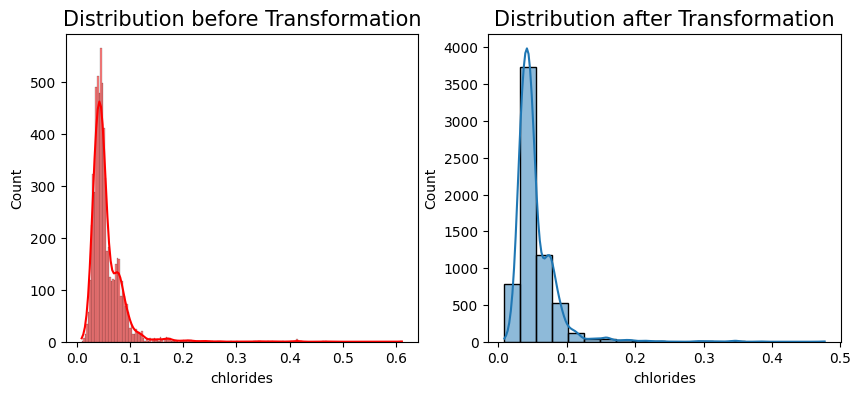

Skewness was 5.4 before & is 4.48 after log transformation.




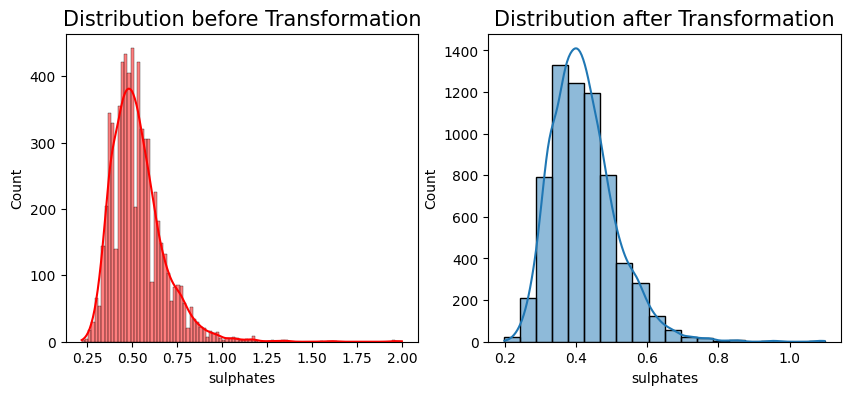

Skewness was 1.8 before & is 1.1 after log transformation.




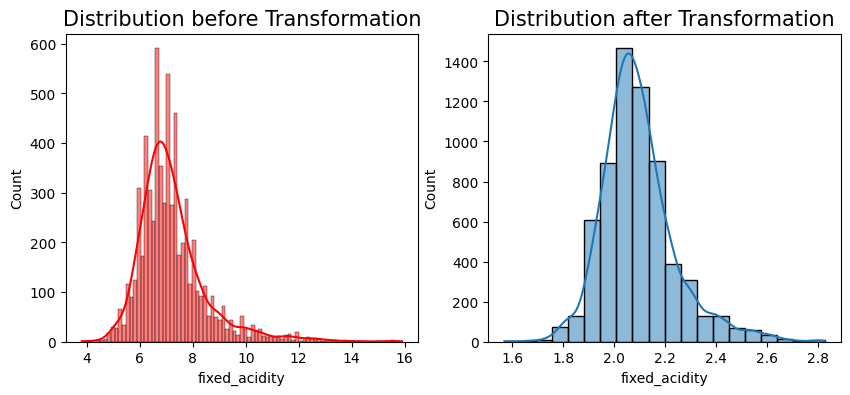

Skewness was 1.72 before & is 0.98 after log transformation.


volatile_acidity has the skewness within the threshold and transform will not be applied.


residual_sugar has the skewness within the threshold and transform will not be applied.


free_sulfur_dioxide has the skewness within the threshold and transform will not be applied.


color_red has the skewness within the threshold and transform will not be applied.


alcohol has the skewness within the threshold and transform will not be applied.


density has the skewness within the threshold and transform will not be applied.


citric_acid has the skewness within the threshold and transform will not be applied.


pH has the skewness within the threshold and transform will not be applied.


quality has the skewness within the threshold and transform will not be applied.


total_sulfur_dioxide has the skewness within the threshold and transform will not be applied.


color_white has the skewness within the threshold and transform w

In [ ]:
# from sklearn.preprocessing import FunctionTransformer
# from sklearn.compose import ColumnTransformer

# def Trans(df: pd.DataFrame, feature: str, transformer: str):   # function to apply transformer and check the distribution with histogram and kdeplot
#     if transformer == "log":
#         trans_function = np.log1p
#     elif transformer == "square":
#         trans_function = np.square
#     else:
#         raise NotImplementedError(transformer)
#     logTr = ColumnTransformer(transformers=[("lg", FunctionTransformer(trans_function), [feature])])

#     plt.figure(figsize=(10,4))
#     plt.subplot(1,2,1)
#     plt.title("Distribution before Transformation", fontsize=15)
#     sns.histplot(df[feature], kde=True, color="red")
#     plt.subplot(1,2,2)

#     feature_transformed = pd.DataFrame(logTr.fit_transform(df))
#     plt.title("Distribution after Transformation", fontsize=15)
#     sns.histplot(feature_transformed,bins=20, kde=True , legend=False)
#     plt.xlabel(feature)
#     plt.show()

#     print(f"Skewness was {round(old_skew[feature],2)} before & is {round(feature_transformed.skew()[0],2)} after {transformer} transformation.\n\n")

#     df_transformed = df.copy()
#     df_transformed[feature] = feature_transformed
#     return df_transformed

# for feature, skew in old_skew.items():
#     if skew >= 1.5:
#         df_transformed = Trans(df=wine_X, feature=feature, transformer="log")
#     elif skew <= -1.5:
#         df_transformed = Trans(df=wine_X, feature=feature, transformer="square")
#     else:
#         print(f"{feature} has the skewness within the threshold and transform will not be applied.\n\n")

*Yeo-Johnson can be used for any distribution, both positive and negative skew, and in general normalize better than log or square transforms.*

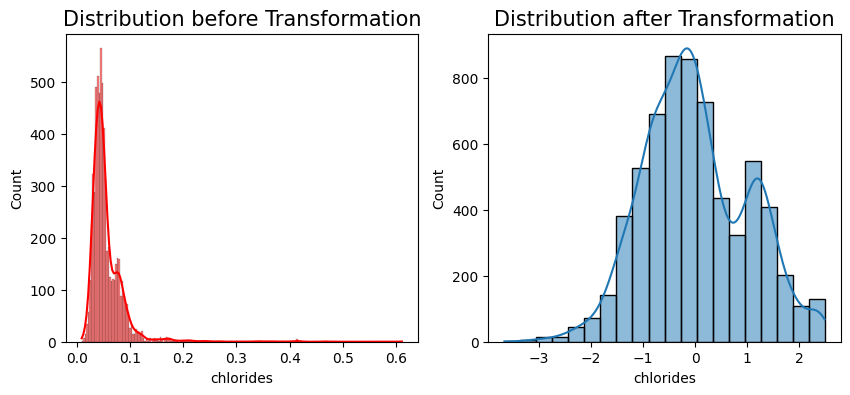

Skewness was 5.4 before & is 0.19 after Yeo-johnson transformation.




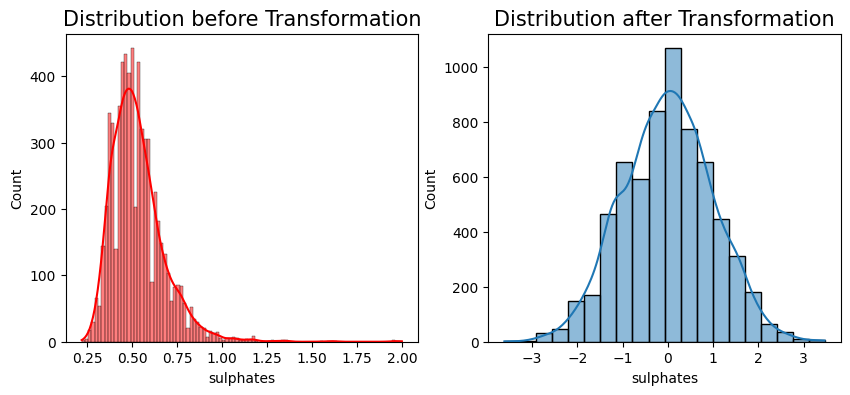

Skewness was 1.8 before & is 0.01 after Yeo-johnson transformation.




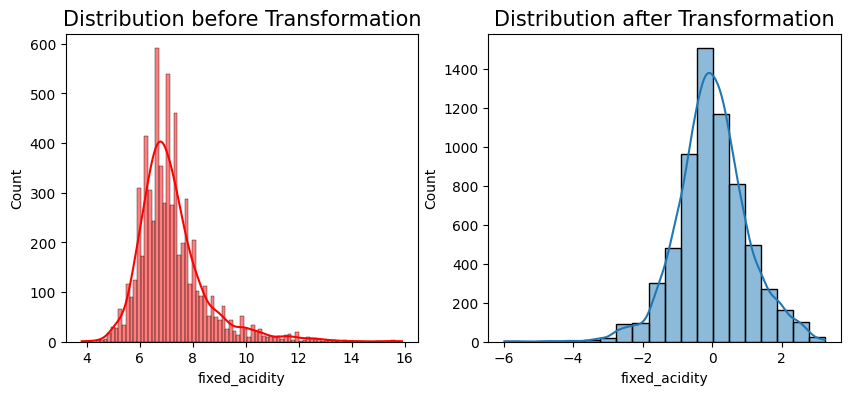

Skewness was 1.72 before & is -0.06 after Yeo-johnson transformation.




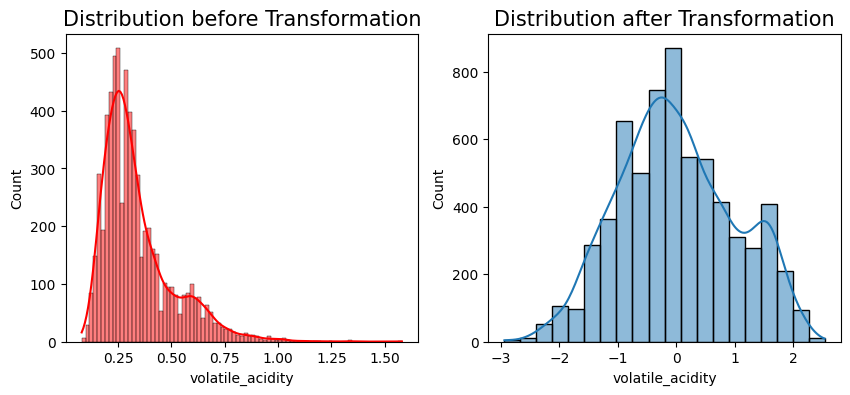

Skewness was 1.5 before & is 0.11 after Yeo-johnson transformation.




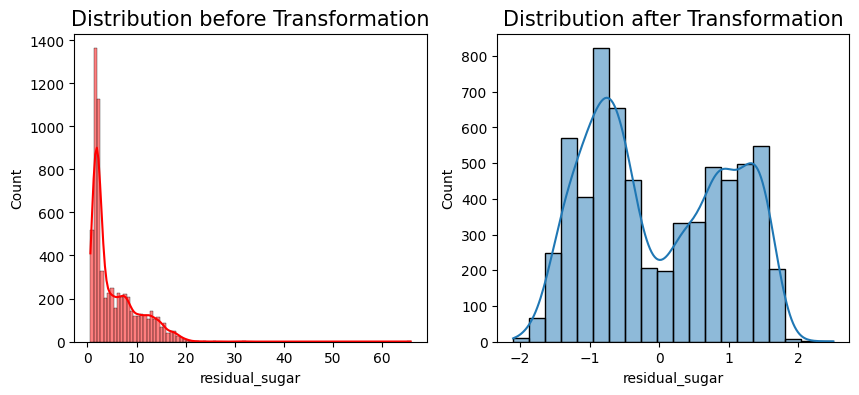

Skewness was 1.44 before & is 0.14 after Yeo-johnson transformation.




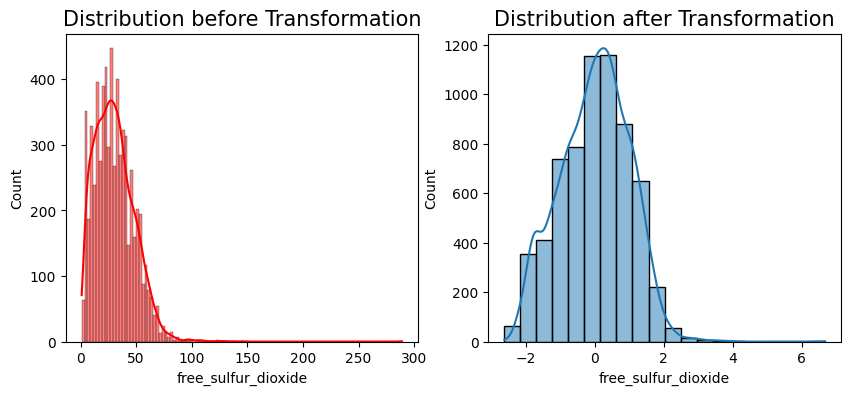

Skewness was 1.22 before & is -0.04 after Yeo-johnson transformation.




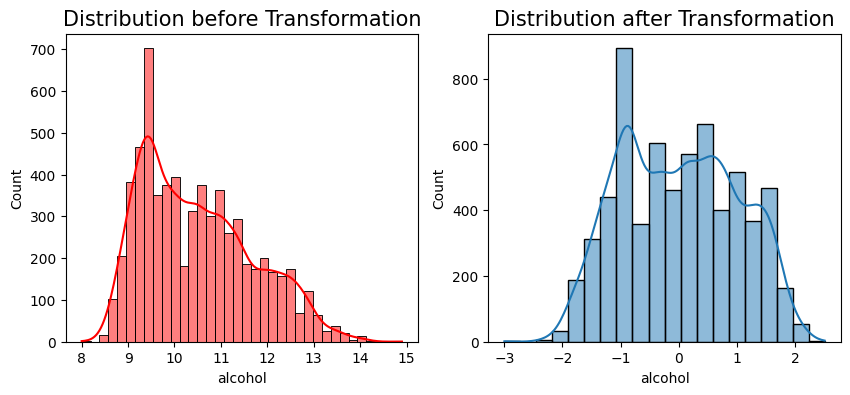

Skewness was 0.57 before & is 0.07 after Yeo-johnson transformation.




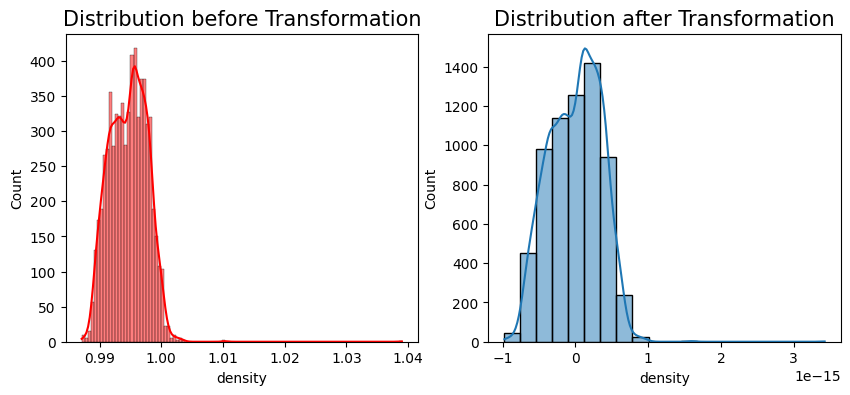

Skewness was 0.5 before & is 0.0 after Yeo-johnson transformation.




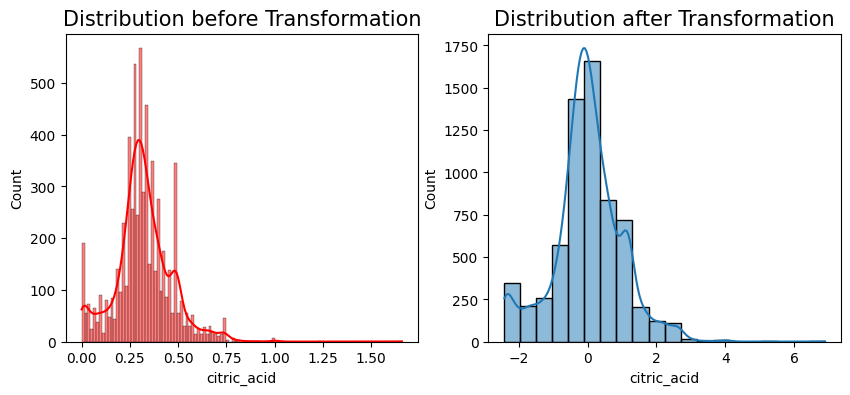

Skewness was 0.47 before & is 0.01 after Yeo-johnson transformation.




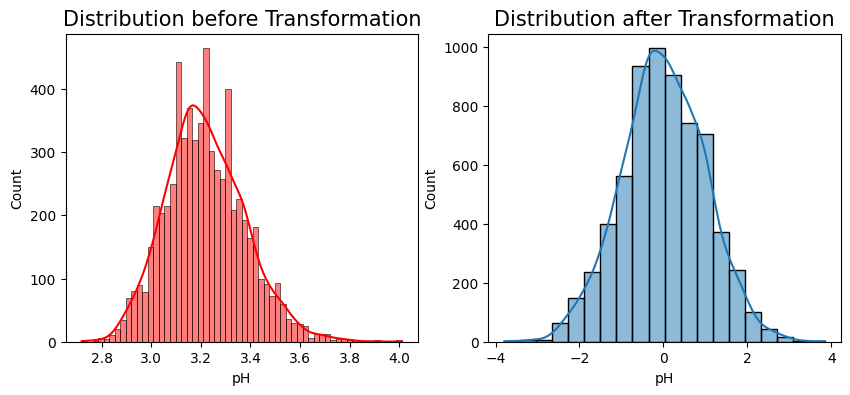

Skewness was 0.39 before & is -0.0 after Yeo-johnson transformation.


total_sulfur_dioxide has the skewness within the threshold and transform will not be applied.




In [7]:
def yeojohntrans(df: pd.DataFrame, feature: str):   # function to apply transformer and check the distribution with histogram and kdeplot

    yeojohnTr = PowerTransformer(standardize=True)   # not using method attribute as yeo-johnson is the default

    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.title("Distribution before Transformation", fontsize=15)
    sns.histplot(df[feature], kde=True, color="red")
    plt.subplot(1,2,2)

    df_yeojohn = pd.DataFrame(yeojohnTr.fit_transform(df[feature].values.reshape(-1,1)))
    plt.title("Distribution after Transformation", fontsize=15)
    sns.histplot(df_yeojohn, bins=20, kde=True, legend=False)
    plt.xlabel(feature)
    plt.show()

    print(f"Skewness was {round(old_skew[feature],2)} before & is {round(df_yeojohn.skew()[0],2)} after Yeo-johnson transformation.\n\n")

    df_transformed = df.copy()
    df_transformed[feature] = df_yeojohn
    return df_transformed

wine_X_transformed = wine_X.copy()
for feature, skew in old_skew.items():
    if abs(skew) >= 0.1:
        wine_X_transformed = yeojohntrans(df=wine_X_transformed, feature=feature)
    else:
        print(f"{feature} has the skewness within the threshold and transform will not be applied.\n\n")

In [5]:
wine_X_transformed

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,color
0,0.355009,1.768074,-2.411240,-0.802041,1.107106,-1.207064,34.0,3.677614e-16,1.704846,0.399903,-0.943215,red
1,0.664384,2.079471,-2.411240,-0.406082,1.624280,-0.157575,67.0,2.567391e-16,-0.055224,1.121737,-0.500302,red
2,0.664384,1.889530,-2.070723,-0.561020,1.507370,-0.857217,54.0,2.775558e-16,0.318214,0.961111,-0.500302,red
3,2.283368,-0.184408,1.600538,-0.802041,1.076989,-0.700833,60.0,3.920475e-16,-0.313979,0.536020,-0.500302,red
4,0.355009,1.768074,-2.411240,-0.802041,1.107106,-1.207064,34.0,3.677614e-16,1.704846,0.399903,-0.943215,red
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,-0.856273,-0.902462,-0.155032,-1.016411,-0.624593,-0.219752,92.0,-4.302114e-16,0.378802,-0.054401,0.715833,white
6493,-0.396191,0.146323,0.326840,0.918039,-0.116386,1.378281,168.0,3.469447e-17,-0.379938,-0.401065,-0.715359,white
6494,-0.505159,-0.570208,-0.881672,-1.364417,-0.488532,0.134724,111.0,-2.532696e-16,-1.509639,-0.401065,-0.943215,white
6495,-1.846389,-0.096955,-0.084912,-1.465850,-2.079644,-0.483649,110.0,-7.563394e-16,0.790300,-1.223864,1.670654,white


##### Question 1.3.

Construct and inspect the box plot of categorical features vs target variable. What do you find?

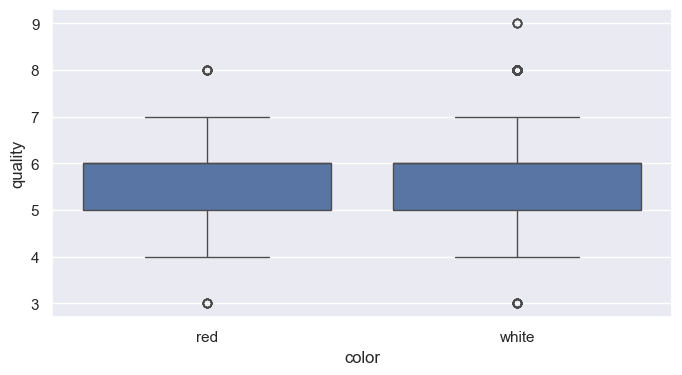

In [6]:
sns.set_theme(rc={'figure.figsize':(8,4)})
ax = sns.boxplot(x="color", y="quality", data=wine_df)

##### Question 1.4.

For the Diamonds dataset, plot the counts by color, cut and clarity

**OR**

For the wine quality dataset, plot histogram for quality scores.

*Refer to "quality" under "Variables" tab in the report above.*

#### 3.1.3. Standardization

Standardization of datasets is a common requirement for many machine learning esti- mators; they might behave badly if the individual features do not more-or-less look like standard normally distributed data: Gaussian with zero mean and unit variance. If a feature has a variance that is orders of magnitude larger than others, it might dominate the objective function and make the estimator unable to learn from other features cor- rectly as expected.


##### Question 2.1.

Standardize feature columns and prepare them for training.

https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

*`PowerTransformer(standardize=True)` includes the effect of `StandardScaler()` while lowering absolute skewness, so we will use `PowerTransformer` for numerical features and `OneHotEncoder` for categorical features.*

In [25]:
pipeline=ColumnTransformer([
    ('num', PowerTransformer(standardize=True), numerical_features),
    ('cat', OneHotEncoder(), categorical_features),
])

X = pipeline.fit_transform(wine_X)
feature_names = pipeline.get_feature_names_out()
X_features = {feature:i for i, feature in enumerate(feature_names)}
X_df = pd.DataFrame(X, columns=feature_names)
y = wine_y.values.ravel()

display(X_features)
display(X)
display(y)

{'num__fixed_acidity': 0,
 'num__volatile_acidity': 1,
 'num__citric_acid': 2,
 'num__residual_sugar': 3,
 'num__chlorides': 4,
 'num__free_sulfur_dioxide': 5,
 'num__total_sulfur_dioxide': 6,
 'num__density': 7,
 'num__pH': 8,
 'num__sulphates': 9,
 'num__alcohol': 10,
 'cat__color_red': 11,
 'cat__color_white': 12}

array([[ 0.35500882,  1.76807414, -2.41123961, ..., -0.94321527,
         1.        ,  0.        ],
       [ 0.66438364,  2.07947101, -2.41123961, ..., -0.50030206,
         1.        ,  0.        ],
       [ 0.66438364,  1.88952954, -2.07072261, ..., -0.50030206,
         1.        ,  0.        ],
       ...,
       [-0.50515946, -0.57020818, -0.88167161, ..., -0.94321527,
         0.        ,  1.        ],
       [-1.8463886 , -0.09695535, -0.08491222, ...,  1.67065438,
         0.        ,  1.        ],
       [-1.11263878, -0.90246239,  0.46081226, ...,  1.11691955,
         0.        ,  1.        ]])

array([5, 5, 5, ..., 6, 7, 6])

#### 3.1.4. Feature Selection

* `sklearn.feature_selection.mutual_info_regression_function` returns estimated mutual information between each feature and the label. Mutual information (MI) between two random variables is a non-negative value which measures the dependency between the variables. It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.
* `sklearn.feature_selection.f_regression` function provides F scores, which is a way of comparing the significance of the improvement of a model, with respect to the addition of new variables.

##### Question 2.2.

You **may** use these functions to select features that yield better regression results (especially in the classical models). Describe how this step qualitatively affects the performance of your models in terms of test RMSE. Is it true for all model types? Also list two features for either dataset that has the lowest MI w.r.t to the target.

*From this point on, you are free to use any combination of features, as long as the performance on the regression model is on par (or slightly worse) than the Neural Network model.*

In [9]:
mir = mutual_info_regression(X, y, discrete_features=[11, 12], random_state=0)
pd.Series({feature: mi for feature, mi in zip(X_features.keys(), mir)}).sort_values(ascending=False)

num__alcohol                 0.164178
num__chlorides               0.068775
num__volatile_acidity        0.064530
num__total_sulfur_dioxide    0.062597
num__residual_sugar          0.052847
num__citric_acid             0.041766
num__free_sulfur_dioxide     0.025748
num__fixed_acidity           0.025547
num__sulphates               0.025223
cat__color_red               0.011410
cat__color_white             0.011410
num__pH                      0.008760
num__density                 0.007099
dtype: float64

In [10]:
f_statistic, p_values = f_regression(X, y)
print("\nF-statitsics:")
print(pd.Series({feature: f for feature, f in zip(X_features.keys(), f_statistic)}).sort_values(ascending=False))
print("\nP-values:")
print(pd.Series({feature: p for feature, p in zip(X_features.keys(), p_values)}).sort_values(ascending=False))


F-statitsics:
num__alcohol                 1467.599346
num__density                  713.741530
num__chlorides                548.271283
num__volatile_acidity         460.552039
cat__color_white               93.811807
cat__color_red                 93.811807
num__citric_acid               62.957664
num__fixed_acidity             61.109401
num__free_sulfur_dioxide       54.655522
num__total_sulfur_dioxide       7.565717
num__sulphates                  3.184423
num__pH                         3.035845
num__residual_sugar             0.603884
dtype: float64

P-values:
num__residual_sugar           4.371282e-01
num__pH                       8.149147e-02
num__sulphates                7.438988e-02
num__total_sulfur_dioxide     5.965376e-03
num__free_sulfur_dioxide      1.616882e-13
num__fixed_acidity            6.257003e-15
num__citric_acid              2.469463e-15
cat__color_red                4.888069e-22
cat__color_white              4.888069e-22
num__volatile_acidity         9.186396e

*Alcohol has the highest mutual information (0.1642), then chlorides (0.0688) followed by volatile acidity (0.0645). This means that alcohol gives 16.42% of the information about the quality of wine. pH (0.0088) and density (0.0071) on the other hand has the lowest MI w.r.t. the quality scores. By using a threshold of 1%, we can decide to exclude pH and density for the following regression analysis.*

*Based on the F-stats and P-values, alchogol, density and chlorides have the significant differences. On the other hand, residual sugar, pH and sulphates are likely to embed the differences that are random than statistically significant. We can safely exclude these three variables based on the threshold of p-value < 0.05.*

*By combining the two analysis above, we will keep density in the features for now.*

In [16]:
features_to_exclude = ["num__residual_sugar", "num__pH", "num__sulphates"]
X_features_selected = {feature: idx for feature, idx in X_features.items() if feature not in features_to_exclude}

X_selected = X[:, list(X_features_selected.values())]
X_selected.shape

(6497, 10)

### 3.2. Training

Once the data is prepared, we would like to train multiple algorithms and compare their performance using average RMSE from 10-fold cross-validation (please refer to part 3.3).

In [21]:
# Yeonje
models = {
    'OLS': LinearRegression(),
    'Lasso': Lasso(),
    'Ridge': Ridge()
}

param_grid = {
    'Lasso': {'alpha': np.linspace(0.01, 100, 100)},
    'Ridge': {'alpha': np.linspace(0.01, 100, 100)}
}

kf = KFold(n_splits=10, shuffle=True, random_state=0)

results = {model_name: {'train_rmse': [], 'val_rmse': []} for model_name in models}

for model_name, model in models.items():
    if model_name in param_grid:
        grid_search = GridSearchCV(model, param_grid[model_name], cv=kf, scoring='neg_mean_squared_error')
        grid_search.fit(X_selected, y)
        best_model = grid_search.best_estimator_
        best_params = grid_search.best_params_
        print(f"Best parameters for {model_name}: {best_params}")
    else:
        best_model = model

    for train_index, val_index in kf.split(X_selected):
        X_train, X_val = X_selected[train_index], X_selected[val_index]
        y_train, y_val = y[train_index], y[val_index]

        best_model.fit(X_train, y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)

        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))

        results[model_name]['train_rmse'].append(train_rmse)
        results[model_name]['val_rmse'].append(val_rmse)

average_rmse = {model_name: {'train_rmse': np.mean(res['train_rmse']), 'val_rmse': np.mean(res['val_rmse'])} for model_name, res in results.items()}

for model_name, rmse in average_rmse.items():
    print(f"{model_name} - Train RMSE: {rmse['train_rmse']:.4f}, Validation RMSE: {rmse['val_rmse']:.4f}\n")

average_rmse_df = pd.DataFrame(average_rmse).T
print(average_rmse_df)

Best parameters for Lasso: {'alpha': 0.01}
Best parameters for Ridge: {'alpha': 15.16}
OLS - Train RMSE: 0.7473, Validation RMSE: 0.7477

Lasso - Train RMSE: 0.7496, Validation RMSE: 0.7498

Ridge - Train RMSE: 0.7472, Validation RMSE: 0.7475

       train_rmse  val_rmse
OLS      0.747329  0.747745
Lasso    0.749641  0.749832
Ridge    0.747212  0.747474


In [ ]:
# Tony
models = {
    'OLS': LinearRegression(),
    'Lasso': Lasso(),
    'Ridge': Ridge()
}

param_grid = {
    'Lasso': {'alpha': np.linspace(0.01, 100, 100)},
    'Ridge': {'alpha': np.linspace(0.01, 100, 100)}
}

kf = KFold(n_splits=10, shuffle=True, random_state=0)

results = {model_name: {'train_rmse': [], 'val_rmse': []} for model_name in models}

for model_name, model in models.items():
    if model_name in param_grid:
        grid_search = GridSearchCV(model, param_grid[model_name], cv=kf, scoring='neg_mean_squared_error')
        grid_search.fit(X, y)
        best_model = grid_search.best_estimator_
        best_params = grid_search.best_params_
        print(f"Best parameters for {model_name}: {best_params}")
    else:
        best_model = model

    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        best_model.fit(X_train, y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)

        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))

        results[model_name]['train_rmse'].append(train_rmse)
        results[model_name]['val_rmse'].append(val_rmse)

average_rmse = {model_name: {'train_rmse': np.mean(res['train_rmse']), 'val_rmse': np.mean(res['val_rmse'])} for model_name, res in results.items()}

for model_name, rmse in average_rmse.items():
    print(f"{model_name} - Train RMSE: {rmse['train_rmse']:.4f}, Validation RMSE: {rmse['val_rmse']:.4f}\n")

average_rmse_df = pd.DataFrame(average_rmse).T
print(average_rmse_df)



Best parameters for Lasso: {'alpha': 0.01}
Best parameters for Ridge: {'alpha': 13.14}
OLS - Train RMSE: 0.7323, Validation RMSE: 0.7334

Lasso - Train RMSE: 0.7365, Validation RMSE: 0.7374

Ridge - Train RMSE: 0.7323, Validation RMSE: 0.7334

       train_rmse  val_rmse
OLS      0.732267  0.733370
Lasso    0.736535  0.737427
Ridge    0.732282  0.733355


### 3.3. Evaluation

Perform 10-fold cross-validation and measure average RMSE errors for training and val- idation sets.

For random forest model, measure “Out-of-Bag Error” (OOB) as well.

In [25]:
# Yeonje
rf_model = RandomForestRegressor(n_estimators=100, oob_score=True, random_state=0)

rf_model.fit(X_selected, y)

oob_error = 1 - rf_model.oob_score_

kf = KFold(n_splits=10, shuffle=True, random_state=0)
train_rmse_list = []
val_rmse_list = []

for train_index, val_index in kf.split(X_selected):
    X_train, X_val = X_selected[train_index], X_selected[val_index]
    y_train, y_val = y[train_index], y[val_index]

    rf_model.fit(X_train, y_train)
    y_train_pred = rf_model.predict(X_train)
    y_val_pred = rf_model.predict(X_val)

    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))

    train_rmse_list.append(train_rmse)
    val_rmse_list.append(val_rmse)

average_train_rmse = np.mean(train_rmse_list)
average_val_rmse = np.mean(val_rmse_list)

print(f"Random Forest - Out-of-Bag Error (OOB): {oob_error:.4f}")
print(f"Random Forest - Average Train RMSE: {average_train_rmse:.4f}")
print(f"Random Forest - Average Validation RMSE: {average_val_rmse:.4f}\n")

results = {
    'Out-of-Bag Error': [oob_error],
    'Average Train RMSE': [average_train_rmse],
    'Average Validation RMSE': [average_val_rmse]
}
results_df = pd.DataFrame(results, index=['Random Forest'])
print(results_df)

Random Forest - Out-of-Bag Error (OOB): 0.4804
Random Forest - Average Train RMSE: 0.2285
Random Forest - Average Validation RMSE: 0.6117

               Out-of-Bag Error  Average Train RMSE  Average Validation RMSE
Random Forest           0.48043            0.228539                  0.61166


In [ ]:
# Tony
rf_model = RandomForestRegressor(n_estimators=100, oob_score=True, random_state=0)

rf_model.fit(X, y)

oob_error = 1 - rf_model.oob_score_

kf = KFold(n_splits=10, shuffle=True, random_state=0)
train_rmse_list = []
val_rmse_list = []

for train_index, val_index in kf.split(X):
    X_train, X_val = X[train_index], X[val_index]
    y_train, y_val = y[train_index], y[val_index]

    rf_model.fit(X_train, y_train)
    y_train_pred = rf_model.predict(X_train)
    y_val_pred = rf_model.predict(X_val)

    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))

    train_rmse_list.append(train_rmse)
    val_rmse_list.append(val_rmse)

average_train_rmse = np.mean(train_rmse_list)
average_val_rmse = np.mean(val_rmse_list)

print(f"Random Forest - Out-of-Bag Error (OOB): {oob_error:.4f}")
print(f"Random Forest - Average Train RMSE: {average_train_rmse:.4f}")
print(f"Random Forest - Average Validation RMSE: {average_val_rmse:.4f}\n")

results = {
    'Out-of-Bag Error': [oob_error],
    'Average Train RMSE': [average_train_rmse],
    'Average Validation RMSE': [average_val_rmse]
}
results_df = pd.DataFrame(results, index=['Random Forest'])
print(results_df)

Random Forest - Out-of-Bag Error (OOB): 0.4585
Random Forest - Average Train RMSE: 0.2233
Random Forest - Average Validation RMSE: 0.5949

               Out-of-Bag Error  Average Train RMSE  Average Validation RMSE
Random Forest          0.458531            0.223323                  0.59494


#### 3.3.1. Linear Regression

What is the objective function? Train three models: (a) ordinary least squares (linear regression without regularization), (b) Lasso and (c) Ridge regression, and answer the following questions.



*   OLS = $\text{minimize} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$

*   Lasso = $\text{minimize} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \lambda \sum_{j=1}^{p} |\beta_j|$


*   Ridge = $\text{minimize} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \lambda \sum_{j=1}^{p} \beta_j^2$








##### Question 4.1.

Explain how each regularization scheme affects the learned parameter set.

The **OLS** function does not contain any regularization parameters. This may cause certain features to have an unproportionate amount of weight within the trained models.

**Lasso** adds the L1 penalty (sum of the absolute values of the feature coefficients).
This regularization methods yields to 0 and effectively performs feature selection. It may lead to sparse models where only a subset of the original features have non-zero coefficients. Model sparsity incereases as λ increases, meaning more coefficients are driven to zero. Lasso works best when we can identify multiple irrelevant features that should be minimized from the data.

**Ridge** adds the L2 penalty (sum of the squared values of the coefficients).
This regularization method minimizes the coefficients very close to 0, but does not set them exactly to zero. The coefficients are reduced more towards zero as λ increases. This effect reduces their weight while simultaneously retaining the features within the model. Ridge works best when attempting to minimize multicollinearity amongst features.

##### Question 4.2.

Report your choice of the best regularization scheme along with the optimal penalty parameter and explain how you computed it.


*   Best parameters for Lasso: {'alpha': 0.01}

*   Best parameters for Ridge: {'alpha': 13.14}

np.linspace was implemented in order to capture the best alpha regularization term for L1 and L2. Instead of defining an array with a set number of regularization terms, a range of numbers between [0.01 , 100] was established. This helps expand the possibilities of finding the L1/L2 terms that best suit the data.





##### Question 4.3.

Does feature standardization play a role in improving the model performance (in the cases with ridge regularization)? Justify your answer.

The performance for the Ridge regularization was only slightly improved in the validation set. The OLS training RSME was lower than the Ridge training RSME.

##### Question 4.4.

Some linear regression packages return p-values for different features [2]. What is the meaning of these p-values and how can you infer the most significant features? A qualitative reasoning is sufficient.

[2] E.g: `scipy.stats.linregress and statsmodels.regression.linear model.OLS`

In [19]:
# Yeonje
from scipy.stats import linregress

p_values = pd.DataFrame(index=X_features, columns=['p_value'])

for feature, i in X_features.items():
    slope, intercept, r_value, p_value, std_err = linregress(X[:, i], y)
    p_values.loc[feature] = p_value

print("p-values of all the features in the wine dataset using scipy.stats.linregress:")
print(p_values)
print("\n")


p-values of all the features in the wine dataset using scipy.stats.linregress:
                            p_value
num__fixed_acidity              0.0
num__volatile_acidity           0.0
num__citric_acid                0.0
num__residual_sugar        0.437128
num__chlorides                  0.0
num__free_sulfur_dioxide        0.0
num__total_sulfur_dioxide  0.005965
num__density                    0.0
num__pH                    0.081491
num__sulphates              0.07439
num__alcohol                    0.0
cat__color_red                  0.0
cat__color_white                0.0




*`linregress` returns the same p-values as the ones returned via `f_regression` under Question 2.2, but with limited precision. As previously mentioned, residual sugar, pH and sulphates are likely to embed the differences that are not statistically significant (i.e. insignificant relationship with the target variable). Using the threshold of p-value < 0.05, we can decide to exclude these three variables.*

*When `f_regression` was used and returned p-values of higher precisions, we could also see that alcohol, density and chloride were the three variables with the highest significance in terms of p-values.*

In [36]:
# Yeonje
import statsmodels.api as sm

X_ = sm.add_constant(X_df)

model = sm.OLS(y, X_).fit()

threshold = 0.05
print(f"Features with p-values > {threshold}:")
for feature, p in model.pvalues.items():
    if p >= threshold:
        print(f"\t{feature}: {p}")

print("\nFull summary:")
print(model.summary())


Features with p-values > 0.05:
	const: 0.6181953177225394
	num__fixed_acidity: 0.23590350126732695
	num__citric_acid: 0.08074680003267326
	num__density: 0.6181953177214528
	num__pH: 0.9320276937389064
	cat__color_red: 0.6181953177208803
	cat__color_white: 0.6181953177209396

Full summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.288
Model:                            OLS   Adj. R-squared:                  0.287
Method:                 Least Squares   F-statistic:                     238.6
Date:                Sat, 01 Jun 2024   Prob (F-statistic):               0.00
Time:                        16:41:52   Log-Likelihood:                -7234.0
No. Observations:                6497   AIC:                         1.449e+04
Df Residuals:                    6485   BIC:                         1.457e+04
Df Model:                          11                                         

*Using OLS and adding constant changes p-values and resulted in different results where pH, density, color, fixed acidity and citric acid have p-values larger than 0.05.*

In [ ]:
# Tony
import scipy.stats as stats
import statsmodels.api as sm
from scipy.stats import linregress

X = wine_X_encoded
y = wine_y.values.ravel()

p_values = pd.DataFrame(index=X.columns, columns=['p_value'])

for feature in X.columns:
    slope, intercept, r_value, p_value, std_err = linregress(X[feature], y)
    p_values.loc[feature] = p_value

print("p-values of all the features in the wine dataset using scipy.stats.linregress:")
print(p_values)
print("\n")

X = wine_X_encoded
y = wine_y

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()

print(model.summary())
print("\n")

X2 = sm.add_constant(wine_X_encoded)
est = sm.OLS(y, X2)
est2 = est.fit()
print("p-values of all the features in the wine dataset using sm.OLS:")
print(est2.pvalues.to_string())


p-values of all the features in the wine dataset using scipy.stats.linregress:
                       p_value
fixed_acidity              0.0
volatile_acidity           0.0
citric_acid                0.0
residual_sugar        0.002871
chlorides                  0.0
free_sulfur_dioxide   0.000008
total_sulfur_dioxide  0.000848
density                    0.0
pH                    0.115931
sulphates             0.001918
alcohol                    0.0
color_red                  0.0
color_white                0.0


                            OLS Regression Results                            
Dep. Variable:                quality   R-squared:                       0.297
Model:                            OLS   Adj. R-squared:                  0.295
Method:                 Least Squares   F-statistic:                     227.8
Date:                Wed, 29 May 2024   Prob (F-statistic):               0.00
Time:                        03:55:59   Log-Likelihood:                -7195.2
No. Observa

#### 3.3.2. Polynomial Regression

Perform polynomial regression by crafting products of features you selected in part 3.1.4 up to a certain degree (max degree 6) and applying ridge regression on the compound features. You can use `scikit-learn` library to build such features. Avoid overfitting by proper regularization. Answer the following:

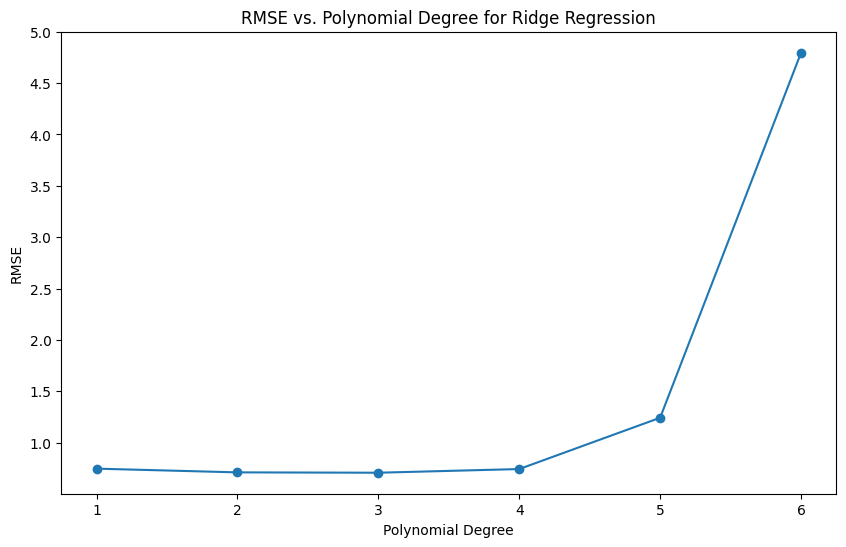

Optimal Polynomial Degree: 3
                                               Feature  Coefficient
8                                         num__alcohol     0.194646
254         num__total_sulfur_dioxide^2 cat__color_red     0.171760
5                             num__free_sulfur_dioxide     0.122993
246  num__free_sulfur_dioxide num__alcohol cat__col...     0.117043
279                      num__alcohol cat__color_red^2     0.106047
61                         num__alcohol cat__color_red     0.106047
154  num__volatile_acidity num__total_sulfur_dioxid...     0.102805
110  num__fixed_acidity num__total_sulfur_dioxide c...     0.098465
62                       num__alcohol cat__color_white     0.088599
281                    num__alcohol cat__color_white^2     0.088599
Optimal Polynomial Degree: 3


In [51]:
# Yeonje
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

def polynomial_ridge_regression(degree):
    poly = PolynomialFeatures(degree)
    X_poly = poly.fit_transform(X_selected)

    model = Ridge(alpha=10.0, solver='cholesky')
    kf = KFold(n_splits=10, shuffle=True, random_state=0)

    rmse_scores = cross_val_score(model, X_poly, y, scoring='neg_mean_squared_error', cv=kf)
    rmse_scores = np.sqrt(-rmse_scores)

    return np.mean(rmse_scores)

degrees = range(1, 7)
rmse_scores = [polynomial_ridge_regression(degree) for degree in degrees]

plt.figure(figsize=(10, 6))
plt.plot(degrees, rmse_scores, marker='o')
plt.xlabel('Polynomial Degree')
plt.ylabel('RMSE')
plt.title('RMSE vs. Polynomial Degree for Ridge Regression')
plt.show()

optimal_degree = degrees[np.argmin(rmse_scores)]
print(f"Optimal Polynomial Degree: {optimal_degree}")

poly = PolynomialFeatures(optimal_degree)
X_poly = poly.fit_transform(X_selected)

model = Ridge(alpha=10.0, solver='cholesky')
model.fit(X_poly, y)

coefficients = model.coef_
features = poly.get_feature_names_out(list(X_features_selected.keys()))

feature_importance = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefficients
}).sort_values(by='Coefficient', ascending=False)

print(feature_importance.head(10))

print(f"Optimal Polynomial Degree: {optimal_degree}")

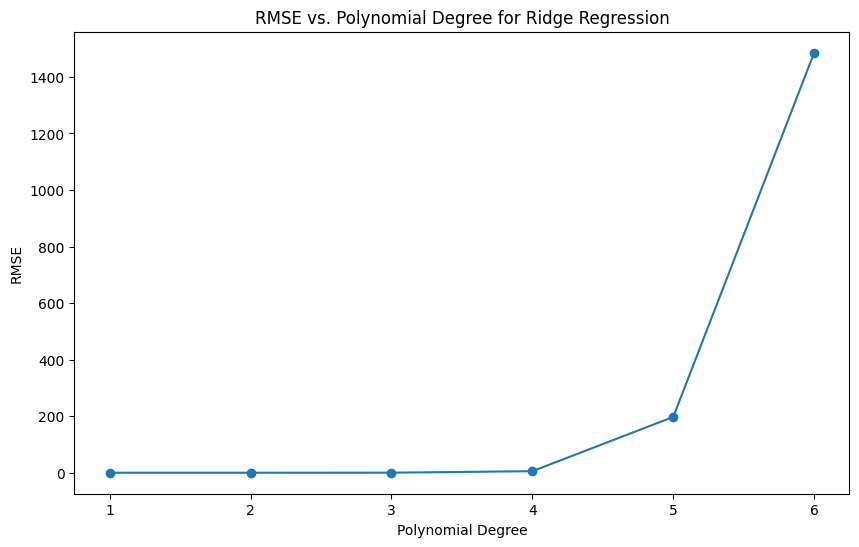

Optimal Polynomial Degree: 2
                                Feature  Coefficient
3                        residual_sugar     0.378749
40               residual_sugar density     0.179455
10                              alcohol     0.170757
1                         fixed_acidity     0.148743
57          free_sulfur_dioxide density     0.117358
9                             sulphates     0.115945
60          free_sulfur_dioxide alcohol     0.111436
5                   free_sulfur_dioxide     0.108504
49                    chlorides density     0.106708
39  residual_sugar total_sulfur_dioxide     0.105257
Optimal Polynomial Degree: 2


In [ ]:
# Tony
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt


selected_features = [
    'fixed_acidity', 'volatile_acidity', 'residual_sugar', 'chlorides',
    'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH',
    'sulphates', 'alcohol', 'color_red', 'color_white'
]

X = wine_X_encoded[selected_features]
y = wine_y.values.ravel()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

def polynomial_ridge_regression(degree):
    poly = PolynomialFeatures(degree)
    X_poly = poly.fit_transform(X_scaled)

    model = Ridge(alpha=10.0, solver='cholesky')
    kf = KFold(n_splits=10, shuffle=True, random_state=0)

    rmse_scores = cross_val_score(model, X_poly, y, scoring='neg_mean_squared_error', cv=kf)
    rmse_scores = np.sqrt(-rmse_scores)

    return np.mean(rmse_scores)

degrees = range(1, 7)
rmse_scores = [polynomial_ridge_regression(degree) for degree in degrees]

plt.figure(figsize=(10, 6))
plt.plot(degrees, rmse_scores, marker='o')
plt.xlabel('Polynomial Degree')
plt.ylabel('RMSE')
plt.title('RMSE vs. Polynomial Degree for Ridge Regression')
plt.show()

optimal_degree = degrees[np.argmin(rmse_scores)]
print(f"Optimal Polynomial Degree: {optimal_degree}")

poly = PolynomialFeatures(optimal_degree)
X_poly = poly.fit_transform(X_scaled)

model = Ridge(alpha=10.0, solver='cholesky')
model.fit(X_poly, y)

coefficients = model.coef_
features = poly.get_feature_names_out(selected_features)

feature_importance = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefficients
}).sort_values(by='Coefficient', ascending=False)

print(feature_importance.head(10))

print(f"Optimal Polynomial Degree: {optimal_degree}")

##### Question 5.1.

What are the most salient features? Why?

##### Qeustion 5.2.


What degree of polynomial is best? How did you find the optimal degree? What does a very high-order polynomial imply about the fit on the training data? What about its performance on testing data?

Based on the reported RSME, the model will optimize it's error with two features. If we keep increasing features, the data may start to overfit or the RSME will start increasing exponentially. This optimal degree was found setting the L2 regularization to 10 as many of the features had p-values below 0.05 which is used to determine their statistical significance.

#### 3.3.3. Neural Network

You will train a multi-layer perceptron (fully connected neural network). You can simply use the `sklearn` implementation:

##### Question 6.1.

Adjust your network size (number of hidden neurons and depth), and weight decay as regularization. Find a good hyper-parameter set systematically (no more than 20 experiments in total).

##### Question 6.2.

How does the performance generally compare with linear regression? Why?

##### Question 6.3.

What activation function did you use for the output and why? You may use none.

##### Question 6.4.

What is the risk of increasing the depth of the network too far?

#### 3.3.4. Random Forest

We will train a random forest regression model on datasets, and answer the following:
* Random forests have the following hyper-parameters:
  - Maximum number of features;
  - Number of trees;
  - Depth of each tree;

##### Question 7.1.

Explain how these hyper-parameters affect the overall performance. Describe if and how each hyper-parameter results in a regularization effect during training.

##### Question 7.2.

How do random forests create a highly non-linear decision boundary despite the fact that all we do at each layer is apply a threshold on a feature?

##### Question 7.3.

Randomly pick a tree in your random forest model (with maximum depth of 4) and plot its structure. Which feature is selected for branching at the root node? What can you infer about the importance of this feature as opposed to others? Do the important features correspond to what you got in part 3.3.1?

##### Question 7.4.

Measure “Out-of-Bag Error” (OOB). Explain what OOB error and R2 score means.

#### 3.3.5. LightGBM, CatBoost, and Bayesian Optimization

Boosted tree methods have shown advantages when dealing with tabular data, and recent advances make these algorithms scalable to large scale data and enable natural treatment of (high-cardinality) categorical features. Two of the most successful examples are Light- GBM [1] and CatBoost [2].

Both algorithms have many hyperparameters that influence their performance. This results in large search space of hyperparameters, making the tuning of the hyperparame- ters hard with naive random search and grid search. Therefore, one may want to utilize “smarter” hyperparameter search schemes. We specifically explore one of them: Bayesian optimization.

In this part, **pick either one** of the datasets and apply LightGBM OR CatBoost. If you do both, we will only look at the first one.

[1] https://lightgbm.readthedocs.io/en/latest/
[2] https://catboost.ai/

##### Question 8.1.

Read the documentation of LightGBM OR CatBoost and determine the important hyperparameters along with a search space for the tuning of these parameters (keep the search space small).

##### Question 8.2.

Apply Bayesian optimization using `skopt.BayesSearchCV` [1] from `scikit-optmize` [2] to find the ideal hyperparameter combination in your search space. Keep your search space small enough to finish running on a single Google Colab instance within 60 minutes. Report the best hyperparameter set found and the corresponding RMSE.

[1] https://scikit-optimize.github.io/stable/auto_examples/sklearn-gridsearchcv-replacement.html
[2] https://scikit-optimize.github.io/stable/

##### Question 8.3.

Qualitatively interpret the effect of the hyperparameters using the Bayesian opti- mization results: Which of them helps with performance? Which helps with reg- ularization (shrinks the generalization gap)? Which affects the fitting efficiency?

# PART II: Show Us Your Skills: Twitter Data

An end-to-end ML pipeline to accomplish any particular goal: regression, classification, clustering or anything else.

### 3.4. About the Data

https://ucla.box.com/s/24oxnhsoj6kpxhl6gyvuck25i3s4426d

The data consists of 6 text files, each one containing tweet data from one hashtag as indicated in the filenames.

In [22]:
data_dir = "data/"

In [62]:
!curl -L  https://ucla.box.com/shared/static/24oxnhsoj6kpxhl6gyvuck25i3s4426d --output ECE219_tweet_data.zip
!unzip ECE219_tweet_data.zip -d {data_dir}

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100    10    0    10    0     0      5      0 --:--:--  0:00:01 --:--:--   151
100 1278M  100 1278M    0     0  33.3M      0  0:00:38  0:00:38 --:--:-- 36.7M     0  31.7M      0  0:00:40  0:00:23  0:00:17 34.7M


In [23]:
tags = [re.search('tweets_#(.*).txt', f).group(1) for f in os.listdir(data_dir) if f.startswith("tweets")]
tags

['nfl', 'superbowl', 'sb49', 'patriots', 'gohawks', 'gopatriots']

In [24]:
def unix_to_datetime(unix_time):
    pst_tz = pytz.timezone('America/Los_Angeles')
    return datetime.datetime.fromtimestamp(unix_time, pst_tz)

##### Question 9.1.

Report the following statistics for each hashtag, i.e. each file has:
* Average number of tweets per hour
* Average number of followers of users posting the tweets per tweet (to make it simple, we average over the number of tweets; if a users posted twice, we count the user and the user’s followers twice as well)
* Average number of retweets per tweet

In [5]:
tweets_data = {}
num_tweets_per_hour = {}
for tag in tags:
    print(f"\nTweets data for #{tag}:")
    posting_times = []
    num_retweets = []
    num_followers = []
    with open(f'{data_dir}tweets_#{tag}.txt', 'r') as file:
        for i, line in enumerate(file.readlines()):
            if i % 100000 == 0:
                print(i)
            tweet = json.loads(line)
            posting_times.append(unix_to_datetime(tweet["citation_date"]))
            num_followers.append(tweet["author"]["followers"])
            num_retweets.append(tweet["metrics"]["citations"]["total"])

    posting_times = pd.Series(posting_times)
    postings_per_hour = posting_times.groupby([posting_times.dt.date, posting_times.dt.hour]).count()
    num_tweets_per_hour[tag] = postings_per_hour

    avg_postings_per_hour = postings_per_hour.mean()
    avg_num_followers = np.mean(num_followers)
    avg_num_retweets = np.mean(num_retweets)
    print(f"\tAverage postings per hour: {avg_postings_per_hour}")
    print(f"\tAverage number of followers per author: {avg_num_followers}")
    print(f"\tAverage number of retweets per tweet: {avg_num_retweets}")


Tweets data for #nfl:
0
100000
200000
	Average postings per hour: 399.69468267581476
	Average number of followers per author: 4662.37544523693
	Average number of retweets per tweet: 1.5344602655543254

Tweets data for #superbowl:
0
100000
200000
300000
400000
500000
600000
700000
800000
900000
1000000
1100000
1200000
	Average postings per hour: 2067.824531516184
	Average number of followers per author: 8814.96799424623
	Average number of retweets per tweet: 2.3911895819207736

Tweets data for #sb49:
0
100000
200000
300000
400000
500000
600000
700000
	Average postings per hour: 1384.8212290502793
	Average number of followers per author: 10374.160292019487
	Average number of retweets per tweet: 2.52713444111402

Tweets data for #patriots:
0
100000
200000
300000
400000
	Average postings per hour: 750.6320272572402
	Average number of followers per author: 3280.4635616550277
	Average number of retweets per tweet: 1.7852871288476946

Tweets data for #gohawks:
0
100000
	Average postings per 

##### Question 9.2.

Plot “number of tweets in hour” over time for `#SuperBowl` and `#NFL` (a bar plot with 1-hour bins). The tweets are stored in separate files for different hashtags and files are named as `tweet_[#hashtag].txt`.

**Note**: The tweet file contains one tweet in each line and tweets are sorted with respect to their posting time. Each tweet is a JSON [1] string that you can load in Python as a dictio- nary. For example, if you parse it to object json_object = json.loads(json_string) , you can look up the time a tweet is posted by:

`json_object['citation_date']`

You may also assess the number of retweets of a tweet through the following command:

`json_object['metrics']['citations']['total']`

Besides, the number of followers of the person tweeting can be retrieved via:

`json_object['author']['followers']`

The time information in the data file is in the form of UNIX time, which “encodes a point in time as a scalar real number which represents the number of seconds that have passed since the beginning of 00:00:00 UTC Thursday, 1 January 1970” (see Wikipedia [2] for details). In Python, you can convert it to human-readable date by

```
import datetime
datetime_object = datetime.datetime.fromtimestamp(unix_time)
```

The conversion above gives out a datetime object storing the date and time in your local time zone corresponding to that UNIX time.



In later parts of the project, you may need to use the PST time zone to interpret the UNIX timestamps. To specify the time zone you would like to use, refer to the example below:

```
import pytz
pst_tz = pytz.timezone('America/Los_Angeles')
datetime_object_in_pst_timezone =
,→ datetime.datetime.fromtimestamp(unix_time, pst_tz)
```

For more details about datetime operation and time zones, see
https://medium.com/@eleroy/10-things-you-need-to-know-about-date-and-time-in-pythoon


[1] https://www.json.org/

[2] https://en.wikipedia.org/wiki/Unix_time

superbowl


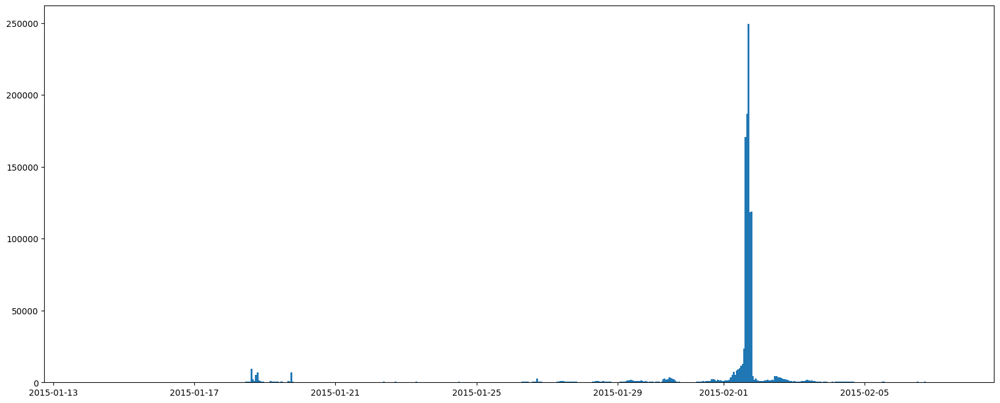

nfl


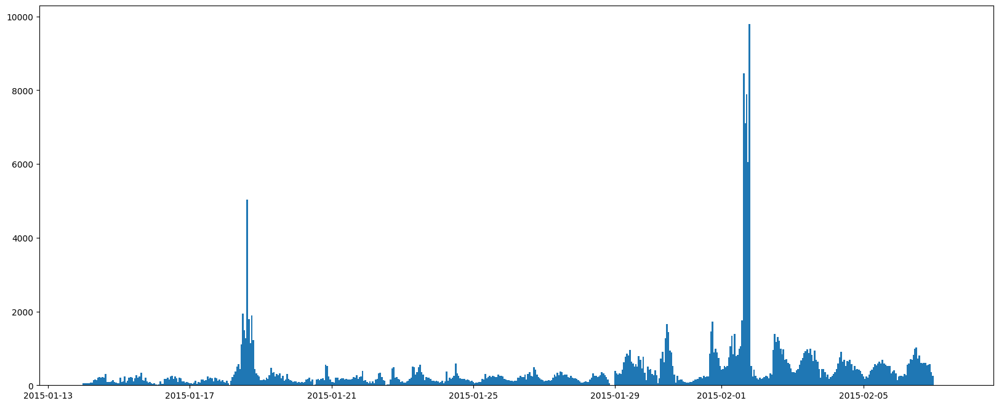

In [8]:
plt.rcParams["figure.figsize"] = (20,8)

for tag in ["superbowl", "nfl"]:
    print(tag)
    hourly_tweets = num_tweets_per_hour[tag]
    x_axis = [datetime.datetime(t[0].year, t[0].month, t[0].day, t[1]) for t in hourly_tweets.index]
    bar_chart = plt.bar(x_axis, hourly_tweets.values, width=0.05)
    plt.show()

##### Question 10.

Follow the steps outlined below:
* Describe your task.
* Explore the data and any metadata (you can even incorporate additional datasets if you choose).
* Describe the feature engineering process. Implement it with reason: Why are you extracting features this way - why not in any other way?
* Generate baselines for your final ML model.
* A thorough evaluation is necessary.
* Be creative in your task design - use things you have learned in other classes too if you are excited about them!